In [1]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.utils import shuffle
from statsmodels.gam.api import GLMGam, BSplines
from pygam import LogisticGAM, s, f, l
from sklearn.preprocessing import PolynomialFeatures
import warnings
warnings.filterwarnings('ignore')

# 1 Review Data

## Part 1

In [2]:
data_train_ori = pd.read_csv('./yelp_train.csv')
data_test_ori = pd.read_csv('./yelp_test.csv')

def data_clearing(data_ori):
    data = data_ori.copy()
    data.drop('date', axis=1, inplace=True)

    user_review_count_is_0 = data[data['user_review_count'] == 0]
    user_review_count_is_0['cool_useraver'] = 0
    user_review_count_is_0['funny_useraver'] = 0
    user_review_count_is_0['useful_useraver'] = 0
    data1 = data[data['user_review_count'] > 0]
    data1['cool_useraver'] = data1['user_cool']/data1['user_review_count']
    data1['funny_useraver'] = data1['user_funny']/data1['user_review_count']
    data1['useful_useraver'] = data1['user_useful']/data1['user_review_count']
    data = data1.append(user_review_count_is_0)
    data.drop({'user_cool','user_funny', 'user_useful', 'user_review_count'}, axis=1, inplace=True)

    p = data[data['stars'] >= 4]    #set lables 
    p['label'] = 1
    n = data[data['stars'] < 4]
    n['label'] = 0
    data = p.append(n)
    data.drop('stars', axis=1, inplace=True)
    data.sort_index(inplace=True)
    return data

data_train = data_clearing(data_train_ori)
data_test = data_clearing(data_test_ori)

### Since whether a review is a positive one is in little correlation with date, we drop the 'date' column. As user_cool, user_useful, user_funny and user_review_count are overall descriptions of the before reviews, we transform them into the average number of votes ever received by the user writing the review. At the same time, we drop the correlated columns  'user_cool', 'user_funny', 'user_useful' and 'user_review_count'.

## Part 2

In [58]:
data_train.columns

Index(['funny', 'useful', 'characters', 'user_average_stars',
       'biz_review_count', 'biz_open', 'biz_stars', 'words', 'cool',
       'cool_useraver', 'funny_useraver', 'useful_useraver', 'label'],
      dtype='object')

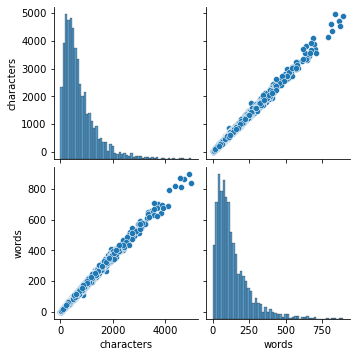

In [47]:
import seaborn as sns
sns.pairplot(data_train[['characters', 'words']])
plt.show()

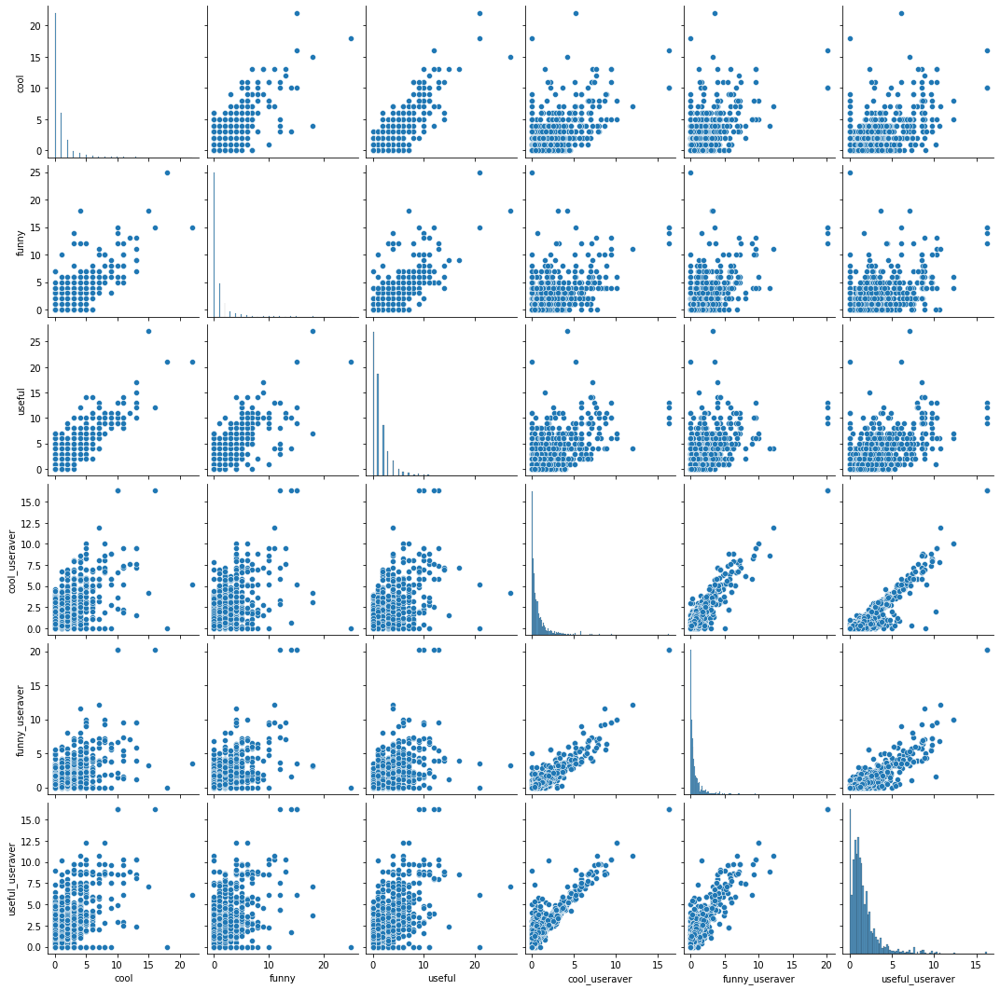

In [48]:
sns.pairplot(data_train[['cool', 'funny', 'useful', 'cool_useraver', 'funny_useraver', 'useful_useraver']])
plt.show()

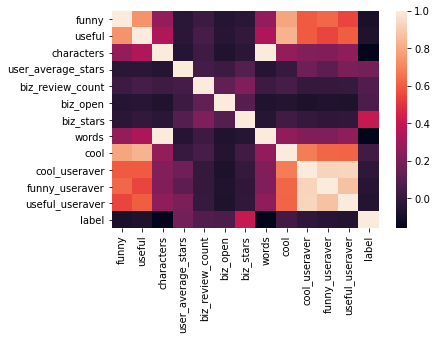

In [59]:
import seaborn as sns
sns.heatmap(data_train.corr(), annot = False )
plt.show()

In [85]:
def data_modifying(data_ori):
    data_ori = data_ori.drop('characters', axis = 1)
    data_ori['f_u_c'] = (data_ori['funny'] + data_ori['useful'] +data_ori['cool'])/3
    data_ori['f_u_c_useraver'] = (data_ori['funny_useraver'] + data_ori['useful_useraver'] +data_ori['cool_useraver'])/3
    data_ori['positive'] = data_ori['label']
    data = data_ori.drop({'funny', 'useful', 'cool', 'funny_useraver', 'useful_useraver', 'cool_useraver', 'label'}, axis = 1)
    return data
data_train = data_modifying(data_train)
data_test = data_modifying(data_test)

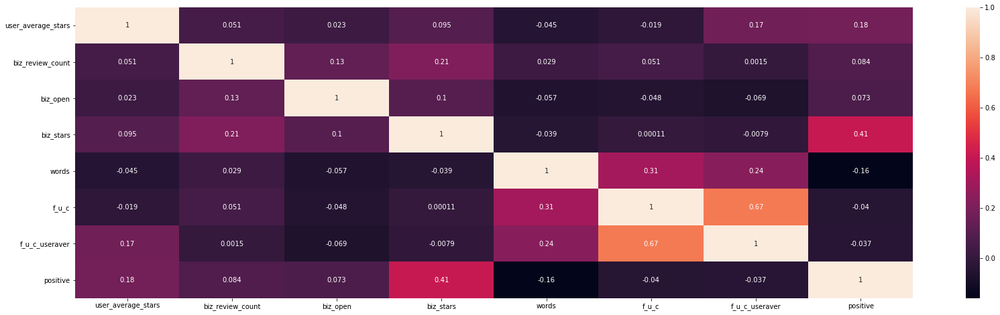

In [123]:
sns.heatmap(data_train.corr(), annot = True)
plt.show()

In [136]:
X_train = data_train.iloc[:, :-1]
y_train = data_train.iloc[:, -1]
X_train = sm.add_constant(X_train)
X_test = data_test.iloc[:, :-1]
y_test = data_test.iloc[:, -1]
X_test = sm.add_constant(X_test)
model = sm.GLM(y_train, X_train, family = sm.families.Binomial(link=sm.families.links.logit())).fit()
print(model.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:               positive   No. Observations:                 3000
Model:                            GLM   Df Residuals:                     2992
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1713.5
Date:                Mon, 17 May 2021   Deviance:                       3426.9
Time:                        16:51:46   Pearson chi2:                 3.01e+03
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -7.0488      0

In [88]:
y_true = y_test
y_pred_class = (model.predict(X_test) > 0.5)
confusion_matrix(y_true, y_pred_class)

array([[328, 190],
       [117, 365]], dtype=int64)

In [89]:
from hw5_helper_function import *
data_train_bs = best_subset(y_train, X_train, threshold = 0.5)

In [91]:
df_maxaccuracy_bs= data_train_bs[data_train_bs.groupby('numb_features')['accuracy'].transform(max) == data_train_bs['accuracy']]
df_maxrecall_bs= data_train_bs[data_train_bs.groupby('numb_features')['recall'].transform(max) == data_train_bs['recall']]
df_maxprecision_bs= data_train_bs[data_train_bs.groupby('numb_features')['precision'].transform(max) == data_train_bs['precision']]
df_maxaccuracy_bs.head(10)

,numb_features,features,accuracy,precision,recall
4,1,"(biz_stars,)",0.678000,0.680420,0.656545
17,2,"(user_average_stars, biz_stars)",0.689000,0.686354,0.682186
66,3,"(user_average_stars, biz_stars, words)",0.700667,0.712209,0.661269
101,4,"(const, user_average_stars, biz_stars, words)",0.700667,0.712209,0.661269
131,4,"(user_average_stars, biz_review_count, biz_sta...",0.700667,0.712518,0.660594
166,5,"(const, user_average_stars, biz_review_count, ...",0.700667,0.712518,0.660594
211,5,"(user_average_stars, biz_stars, words, f_u_c, ...",0.700667,0.711594,0.662618
243,6,"(user_average_stars, biz_review_count, biz_sta...",0.701667,0.713455,0.661943
253,7,"(user_average_stars, biz_review_count, biz_ope...",0.702667,0.713768,0.664642
254,8,"(const, user_average_stars, biz_review_count, ...",0.702667,0.713768,0.664642


In [92]:
df_maxprecision_bs.head(10)

,numb_features,features,accuracy,precision,recall
1,1,"(user_average_stars,)",0.604000,0.684211,0.368421
17,2,"(user_average_stars, biz_stars)",0.689000,0.686354,0.682186
66,3,"(user_average_stars, biz_stars, words)",0.700667,0.712209,0.661269
131,4,"(user_average_stars, biz_review_count, biz_sta...",0.700667,0.712518,0.660594
166,5,"(const, user_average_stars, biz_review_count, ...",0.700667,0.712518,0.660594
243,6,"(user_average_stars, biz_review_count, biz_sta...",0.701667,0.713455,0.661943
253,7,"(user_average_stars, biz_review_count, biz_ope...",0.702667,0.713768,0.664642
254,8,"(const, user_average_stars, biz_review_count, ...",0.702667,0.713768,0.664642


In [93]:
df_maxrecall_bs.head(10)

,numb_features,features,accuracy,precision,recall
4,1,"(biz_stars,)",0.678000,0.680420,0.656545
17,2,"(user_average_stars, biz_stars)",0.689000,0.686354,0.682186
58,3,"(user_average_stars, biz_review_count, biz_stars)",0.689333,0.686567,0.682861
62,3,"(user_average_stars, biz_open, biz_stars)",0.689000,0.686102,0.682861
93,4,"(const, user_average_stars, biz_review_count, ...",0.689333,0.686567,0.682861
97,4,"(const, user_average_stars, biz_open, biz_stars)",0.689000,0.686102,0.682861
162,5,"(const, user_average_stars, biz_review_count, ...",0.689333,0.686821,0.682186
219,6,"(const, user_average_stars, biz_review_count, ...",0.689333,0.688098,0.678812
248,7,"(const, user_average_stars, biz_review_count, ...",0.693000,0.694387,0.676113
254,8,"(const, user_average_stars, biz_review_count, ...",0.702667,0.713768,0.664642


In [118]:
X, y = X_train.iloc[:, 1:].values, y_train.values
gam = LogisticGAM().gridsearch(X, y)
gam.summary()

100% (11 of 11) |########################| Elapsed Time: 0:00:13 Time:  0:00:13
LogisticGAM                                                                                               
=============================================== ==========================================================
Distribution:                      BinomialDist Effective DoF:                                     16.4695
Link Function:                        LogitLink Log Likelihood:                                  -1560.481
Number of Samples:                         3000 AIC:                                             3153.9011
                                                AICc:                                            3154.1175
                                                UBRE:                                               3.0557
                                                Scale:                                                 1.0
                                                Pseudo R-Squared

In [124]:
gam.accuracy(X_test.iloc[:,1:], y_test)

0.7423333333333333


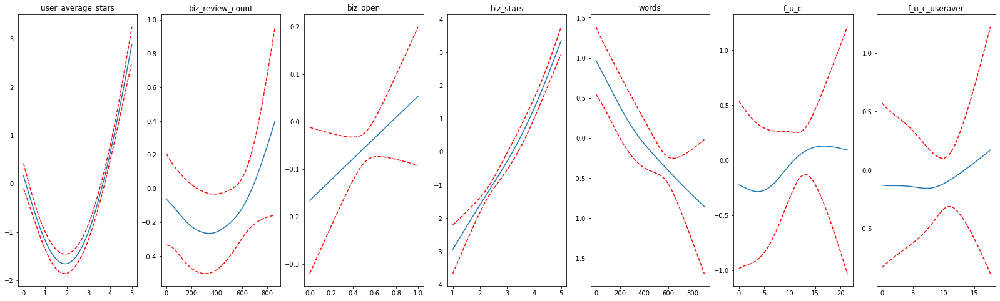

In [97]:
plt.rcParams['figure.figsize'] = (28, 8)
fig, axs = plt.subplots(1, len(data_train.columns[:-1]))
titles = data_train.columns
for i, ax in enumerate(axs):
    XX = gam.generate_X_grid(term=i)
    ax.plot(XX[:, i], gam.partial_dependence(term=i, X=XX))
    ax.plot(XX[:, i], gam.partial_dependence(term=i, X=XX,   width=.95)[1], c='r', ls='--')
    ax.set_title(titles[i])
plt.show()

In [102]:
lambda_ = 0.4
n_splines = [6, 6, 25, 6, 6, 100, 100] 
constraints = None
gam = LogisticGAM(constraints=constraints, 
          lam=lambda_,
         n_splines=n_splines).fit(X, y)
gam = LogisticGAM(s(0)+s(1)+f(2)+s(3)+s(4)+s(5)+s(6)).gridsearch(X, y)
gam.summary()

100% (11 of 11) |########################| Elapsed Time: 0:00:13 Time:  0:00:13
LogisticGAM                                                                                               
=============================================== ==========================================================
Distribution:                      BinomialDist Effective DoF:                                     15.7295
Link Function:                        LogitLink Log Likelihood:                                 -1561.1144
Number of Samples:                         3000 AIC:                                             3153.6878
                                                AICc:                                            3153.8867
                                                UBRE:                                               3.0554
                                                Scale:                                                 1.0
                                                Pseudo R-Squared

In [103]:
gam.accuracy(X_test.iloc[:,1:], y_test)
gam.accuracy(X, y)

0.741

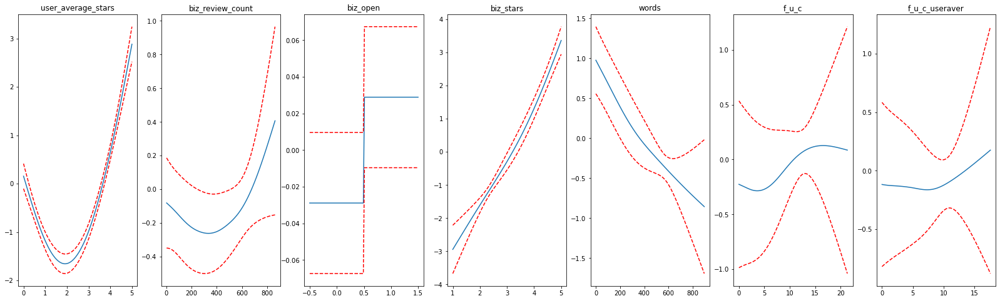

In [104]:
plt.rcParams['figure.figsize'] = (28, 8)
fig, axs = plt.subplots(1, len(data_train.columns[:-1]))
titles = data_train.columns
for i, ax in enumerate(axs):
    XX = gam.generate_X_grid(term=i)
    ax.plot(XX[:, i], gam.partial_dependence(term=i, X=XX))
    ax.plot(XX[:, i], gam.partial_dependence(term=i, X=XX,   width=.95)[1], c='r', ls='--')
    ax.set_title(titles[i])
plt.show()

## Part 3

### First, we plot the pairplot and the heatmap between variables and find that there exist high correlation between 'words' and 'characters', and among 'cool', 'funny', 'useful', 'cool_useraver', 'funny_useraver', 'useful_useraver', so we replace these variables with their means. Then we fit the logistic regression and implete the best subest to select the variable. However, the results show that the accuracy, precision and recall don't vary much among different combinations of features. Next, we fit the GAM model with splines for all features and get the accuracy 0.742. Finally, we change the spline for 'biz_open' into factor but get accuracy 0.741. So the best model is the GAM model with splines for all features.

### The coefficients for GAM have little interpretation so we'd like to explore the coefficients of logistic model. The coef of user_average_stars is 0.3 which meas when the user used to give more stars he will be more likely to give positive review this time. The coef of biz_review_count is negative but close to zero which means that too many reviews may have some bad reviews and thus lead to positive this time. The coef of biz_open is positive so the open of business lead to positive review. And the coef of biz_stars is positive and relatively large so more stars the biz recieved before represent better service and contribute to positive review of new users much. The coef of words is negative which means that too much words may derive from complaints and bad reviews. The coef of average numbers of 'funny', 'useful' and 'cool' the user write this time is positive but average numbers of 'funny', 'useful' and 'cool' the user write in previous reviews is negative which means that when the number of positive words is larger than the past average, the review tends to be posive.

# 2 Bone Data

## Part 1

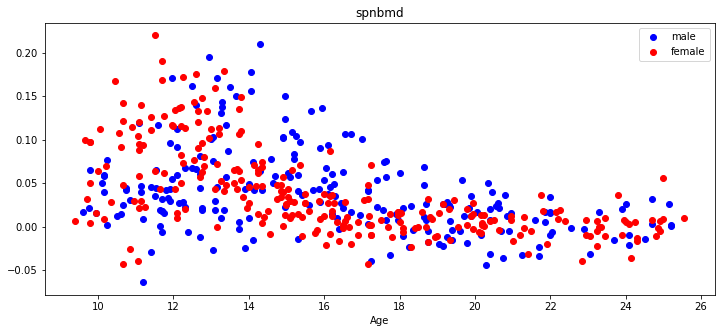

In [3]:
Bone_data = pd.read_csv('./bone.csv')
male = Bone_data[Bone_data['gender'] == 'male']
female = Bone_data[Bone_data['gender'] == 'female']
X_male = male.iloc[:,1]
y_male = male.iloc[:,3]
X_female = female.iloc[:,1]
y_female = female.iloc[:,3]
X_total = Bone_data.iloc[:,1]
y_total = Bone_data.iloc[:,3]
plt.subplots(figsize = (12,5))	
plt.scatter(male.iloc[:, 1].values, male.iloc[:, 3].values, c = "b",label = "male")
plt.scatter(female.iloc[:, 1].values, female.iloc[:, 3].values, c = "r",label = "female")
plt.xlabel("Age")
plt.title("spnbmd")
plt.legend()
plt.show()

### With age growing, the spnbmd of both male and female increase first to a highest point and then decreases slowly. But as for the highest point, it comes later for the male in contrast to female.

## Part 2

### a) step functions have 3 coefficients fitted

In [4]:
x = X_male
y = y_male
df_cut, bins = pd.qcut(x, 3, retbins=True)
df_steps_dummies = pd.get_dummies(df_cut)
df_steps_dummies = df_steps_dummies.drop(df_steps_dummies.columns[0], axis = 1)
model = sm.OLS(y, sm.add_constant(df_steps_dummies)).fit()
print(bins)

[ 9.6  13.45 17.9  25.2 ]


In [4]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 spnbmd   R-squared:                       0.221
Model:                            OLS   Adj. R-squared:                  0.214
Method:                 Least Squares   F-statistic:                     31.60
Date:                Tue, 18 May 2021   Prob (F-statistic):           8.27e-13
Time:                        08:32:06   Log-Likelihood:                 390.82
No. Observations:                 226   AIC:                            -775.6
Df Residuals:                     223   BIC:                            -765.4
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0531      0.005     10.711      0.000       0.043       0.063
(13.45, 17.9]     0.0052      0.007      0.734      0.464      -0.009       0.019
(17.9, 25.2]     -0.0458      0.007     -6.506      0.000      -0.060      -0.032
==============================================================================
Omnibus:                       24.566   Durbin-Watson:                   1.652
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               32.483
Skew:                           0.719   Prob(JB):                     8.84e-08
Kurtosis:                       4.175   Cond. No.                         3.72
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [5]:
x1 = X_female
y1 = y_female
df_cut1, bins1 = pd.qcut(x1, 3, retbins=True)
df_steps_dummies1 = pd.get_dummies(df_cut1)
df_steps_dummies1 = df_steps_dummies1.drop(df_steps_dummies1.columns[0], axis = 1)
model1 = sm.OLS(y1, sm.add_constant(df_steps_dummies1)).fit()
print(bins1)

[ 9.4  13.7  17.5  25.55]


In [6]:
model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 spnbmd   R-squared:                       0.441
Model:                            OLS   Adj. R-squared:                  0.437
Method:                 Least Squares   F-statistic:                     101.0
Date:                Tue, 18 May 2021   Prob (F-statistic):           4.71e-33
Time:                        08:32:07   Log-Likelihood:                 481.60
No. Observations:                 259   AIC:                            -957.2
Df Residuals:                     256   BIC:                            -946.5
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0835      0.004     20.547      0.000       0.076       0.092
(13.7, 17.5]     -0.0540      0.006     -9.362      0.000      -0.065      -0.043
(17.5, 25.55]    -0.0803      0.006    -13.930      0.000      -0.092      -0.069
==============================================================================
Omnibus:                       15.087   Durbin-Watson:                   1.772
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               32.478
Skew:                           0.235   Prob(JB):                     8.86e-08
Kurtosis:                       4.670   Cond. No.                         3.72
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

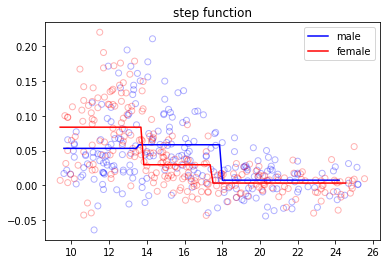

In [7]:
x_space = np.linspace(x.min(),x.max()-1,100) 
bin_mapping = np.digitize(x_space, bins)  # use the same bins
x_space_dummy = pd.get_dummies(bin_mapping) 
x_space_dummy = x_space_dummy.drop(x_space_dummy.columns[0], axis = 1)
pred = model.predict(sm.add_constant(x_space_dummy))
plt.scatter(x, y, facecolor='None', edgecolor='b', alpha=0.3)
plt.plot(x_space,pred,'b-',label = "male")
plt.title('spnbmd')

x_space1 = np.linspace(x1.min(),x1.max()-1,100) 
bin_mapping1 = np.digitize(x_space1, bins1)  # use the same bins
x_space_dummy1 = pd.get_dummies(bin_mapping1) 
x_space_dummy1 = x_space_dummy1.drop(x_space_dummy1.columns[0], axis = 1)
pred = model1.predict(sm.add_constant(x_space_dummy1))
plt.scatter(x1, y1, facecolor='None', edgecolor='r', alpha=0.3)
plt.plot(x_space1,pred,'r-', label = "female")
plt.title('step function')
plt.legend()
plt.show()

### b) cubic spline has 6 coefficients fitted

In [8]:
from patsy import dmatrix
x = X_male
y = y_male
transformed_x = dmatrix("bs(x, knots=(13.45,17.9), degree=3, include_intercept=False)", {"x": x},return_type='dataframe')
model_1 = sm.OLS(y, transformed_x).fit()
pred = model_1.predict(dmatrix("bs(x, knots=(13.45,17.9), include_intercept=False)", {"x": x}, return_type='dataframe'))
x2 = X_female
y2 = y_female
transformed_x2 = dmatrix("bs(x, knots=(13.7, 17.5),degree =3, include_intercept=False)", {"x": x2}, return_type='dataframe')
model_2 = sm.OLS(y2, transformed_x2).fit()
pred2 = model_2.predict(dmatrix("bs(x, knots=(13.7, 17.5),degree =3, include_intercept=False)", {"x": x2}, return_type='dataframe'))

In [9]:
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 spnbmd   R-squared:                       0.303
Model:                            OLS   Adj. R-squared:                  0.287
Method:                 Least Squares   F-statistic:                     19.09
Date:                Tue, 18 May 2021   Prob (F-statistic):           9.14e-16
Time:                        08:32:08   Log-Likelihood:                 403.36
No. Observations:                 226   AIC:                            -794.7
Df Residuals:                     220   BIC:                            -774.2
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
====================================================================================================================================
                                                                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                            0.0426      0.019      2.268      0.024       0.006       0.080
bs(x, knots=(13.45, 17.9), degree=3, include_intercept=False)[0]    -0.0345      0.030     -1.140      0.256      -0.094       0.025
bs(x, knots=(13.45, 17.9), degree=3, include_intercept=False)[1]     0.0855      0.020      4.220      0.000       0.046       0.125
bs(x, knots=(13.45, 17.9), degree=3, include_intercept=False)[2]    -0.0693      0.030     -2.282      0.023      -0.129      -0.009
bs(x, knots=(13.45, 17.9), degree=3, include_intercept=False)[3]    -0.0321      0.027     -1.190      0.235      -0.085       0.021
bs(x, knots=(13.45, 17.9), degree=3, include_intercept=False)[4]    -0.0387      0.027     -1.460      0.146      -0.091       0.014
==============================================================================
Omnibus:                       10.906   Durbin-Watson:                   1.696
Prob(Omnibus):                  0.004   Jarque-Bera (JB):               12.348
Skew:                           0.419   Prob(JB):                      0.00208
Kurtosis:                       3.779   Cond. No.                         20.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [10]:
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 spnbmd   R-squared:                       0.509
Model:                            OLS   Adj. R-squared:                  0.499
Method:                 Least Squares   F-statistic:                     52.46
Date:                Tue, 18 May 2021   Prob (F-statistic):           3.31e-37
Time:                        08:32:08   Log-Likelihood:                 498.41
No. Observations:                 259   AIC:                            -984.8
Df Residuals:                     253   BIC:                            -963.5
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===================================================================================================================================
                                                                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------------------
Intercept                                                           0.0154      0.015      1.009      0.314      -0.015       0.046
bs(x, knots=(13.7, 17.5), degree=3, include_intercept=False)[0]     0.1209      0.026      4.637      0.000       0.070       0.172
bs(x, knots=(13.7, 17.5), degree=3, include_intercept=False)[1]     0.0462      0.016      2.921      0.004       0.015       0.077
bs(x, knots=(13.7, 17.5), degree=3, include_intercept=False)[2]    -0.0469      0.025     -1.877      0.062      -0.096       0.002
bs(x, knots=(13.7, 17.5), degree=3, include_intercept=False)[3]     0.0063      0.023      0.274      0.784      -0.039       0.052
bs(x, knots=(13.7, 17.5), degree=3, include_intercept=False)[4]    -0.0212      0.023     -0.922      0.357      -0.067       0.024
==============================================================================
Omnibus:                       15.644   Durbin-Watson:                   1.761
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               43.733
Skew:                          -0.044   Prob(JB):                     3.19e-10
Kurtosis:                       5.011   Cond. No.                         21.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

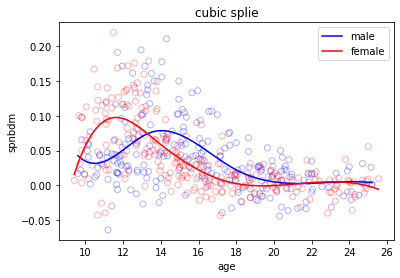

In [11]:
x_space1 = np.linspace(x.min(),x.max(),70)
x_space2 = np.linspace(x2.min(),x2.max(),70)

pred1 = model_1.predict(dmatrix("bs(x, knots=(13.45,17.9),degree =3,include_intercept=False)", {"x": x_space1}, return_type='dataframe'))
pred2 = model_2.predict(dmatrix("bs(x, knots=(13.7, 17.5),degree =3, include_intercept=False)", {"x": x_space2}, return_type='dataframe'))

plt.scatter(x, y, facecolor='None', edgecolor='b', alpha=0.3)
plt.scatter(x2, y2, facecolor='None', edgecolor='r', alpha=0.3)
plt.plot(x_space1, pred1, color='b', label='male')
plt.plot(x_space2, pred2, color='r', label='female')
plt.legend()
plt.xlabel('age')
plt.ylabel('spnbdm')
plt.title('cubic splie')
plt.show()

### c) natural spline has 5 coefficients fitted

In [12]:
x = X_male
y = y_male
transformed_x = dmatrix("cr(x, knots=(13.45,17.9))", {"x": x},return_type='dataframe')
model_1 = sm.OLS(y, transformed_x).fit()
pred = model_1.predict(dmatrix("cr(x, knots=(13.45,17.9))", {"x": x}, return_type='dataframe'))
x2 = X_female
y2 = y_female
transformed_x2 = dmatrix("cr(x, knots=(14.78333333,20.16666667))", {"x": x2}, return_type='dataframe')
model_2 = sm.OLS(y2, transformed_x2).fit()
pred2 = model_2.predict(dmatrix("cr(x, knots=(14.78333333,20.16666667))", {"x": x2}, return_type='dataframe'))

In [13]:
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 spnbmd   R-squared:                       0.287
Model:                            OLS   Adj. R-squared:                  0.278
Method:                 Least Squares   F-statistic:                     29.85
Date:                Tue, 18 May 2021   Prob (F-statistic):           2.98e-16
Time:                        08:32:10   Log-Likelihood:                 400.92
No. Observations:                 226   AIC:                            -793.8
Df Residuals:                     222   BIC:                            -780.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                         0.0227      0.003      7.328      0.000       0.017       0.029
cr(x, knots=(13.45, 17.9))[0]    -0.0135      0.010     -1.389      0.166      -0.033       0.006
cr(x, knots=(13.45, 17.9))[1]     0.0507      0.005     10.223      0.000       0.041       0.061
cr(x, knots=(13.45, 17.9))[2]     0.0034      0.006      0.612      0.541      -0.008       0.014
cr(x, knots=(13.45, 17.9))[3]    -0.0179      0.011     -1.650      0.100      -0.039       0.003
==============================================================================
Omnibus:                        9.896   Durbin-Watson:                   1.692
Prob(Omnibus):                  0.007   Jarque-Bera (JB):               10.750
Skew:                           0.407   Prob(JB):                      0.00463
Kurtosis:                       3.692   Cond. No.                     6.93e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.34e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [14]:
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 spnbmd   R-squared:                       0.423
Model:                            OLS   Adj. R-squared:                  0.416
Method:                 Least Squares   F-statistic:                     62.31
Date:                Tue, 18 May 2021   Prob (F-statistic):           2.97e-30
Time:                        08:32:10   Log-Likelihood:                 477.50
No. Observations:                 259   AIC:                            -947.0
Df Residuals:                     255   BIC:                            -932.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
Intercept                                      0.0302      0.003     11.381      0.000       0.025       0.035
cr(x, knots=(14.78333333, 20.16666667))[0]     0.0615      0.007      8.221      0.000       0.047       0.076
cr(x, knots=(14.78333333, 20.16666667))[1]     0.0192      0.005      4.265      0.000       0.010       0.028
cr(x, knots=(14.78333333, 20.16666667))[2]    -0.0383      0.005     -7.251      0.000      -0.049      -0.028
cr(x, knots=(14.78333333, 20.16666667))[3]    -0.0122      0.010     -1.277      0.203      -0.031       0.007
==============================================================================
Omnibus:                       15.374   Durbin-Watson:                   1.759
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               29.374
Skew:                           0.299   Prob(JB):                     4.18e-07
Kurtosis:                       4.538   Cond. No.                     1.31e+16
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.09e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

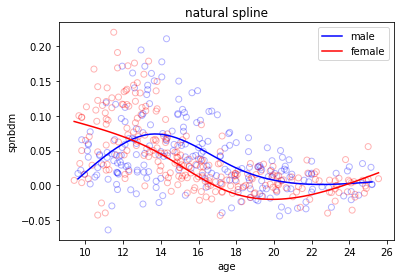

In [15]:
x_space1 = np.linspace(x.min(),x.max(),70)
x_space2 = np.linspace(x2.min(),x2.max(),70)

pred1 = model_1.predict(dmatrix("cr(x, knots=(13.45,17.9))", {"x": x_space1}, return_type='dataframe'))
pred2 = model_2.predict(dmatrix("cr(x, knots=(13.7, 17.5))", {"x": x_space2}, return_type='dataframe'))

plt.scatter(x, y, facecolor='None', edgecolor='b', alpha=0.3)
plt.scatter(x2, y2, facecolor='None', edgecolor='r', alpha=0.3)
plt.plot(x_space1, pred1, color='b', label='male')
plt.plot(x_space2, pred2, color='r', label='female')
plt.legend()
plt.xlabel('age')
plt.ylabel('spnbdm')
plt.title('natural spline')
plt.show()

### d) Piecewise quadratic has 9 coefficients fitted

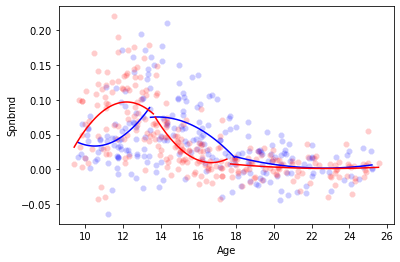

In [81]:
colors = ['b','r']
Label_Com = ['male','female']
Gender = ['male','female']

for index in range(2):
    DATA = Bone_data.loc[Bone_data['gender'] == Gender[index]]
    p_1=np.percentile(DATA['age'],33)
    p_2=np.percentile(DATA['age'],67)
    p = [0,p_1,p_2]
    DATA['age_1'] = ''
    DATA['age_1'] = np.where(DATA['age'] >= p_1 , 1, 0)
    DATA['age_2'] = ''
    DATA['age_2'] = np.where(DATA['age'] >= p_2 , 1, 0)
    DATA['piece'] = ''
    DATA['piece'] = DATA['age_1']+DATA['age_2']
    
    for i in range(3):
        x = DATA.loc[DATA['piece'] == i]['age']
        y = DATA.loc[DATA['piece'] == i]['spnbmd']
        
        polynomial_features= PolynomialFeatures(degree=2)
        xp2 = polynomial_features.fit_transform(np.array(x).reshape(-1,1))
    
        model = sm.OLS(y, xp2).fit()
        x_space = np.linspace(x.min(),x.max(),100)
        xp_space = polynomial_features.transform(x_space.reshape(-1,1))
        pred_plot = model.predict(xp_space)
    
        plt.scatter(x, y, c=colors[index], cmap='brg', s=40, alpha=0.2, marker='8', linewidth=0)
        plt.plot(x_space, pred_plot, c = colors[index])

plt.xlabel('Age')
plt.ylabel('Spnbmd')
plt.show()

### e) Continuous piecewise quadratic has 12 coefficients fitted

In [114]:
def get_X_continuous_piecewise_quadratic(x0,x):
    p_1 = np.percentile(x0,33)
    p_2 = np.percentile(x0,67)
    bins1 = [0, p_1, p_2, 100]
    df_cut, bins = pd.cut(x, bins1, retbins=True, right=False)
    df_steps_dummies = pd.get_dummies(df_cut)
    x_x = pd.concat([x,x], axis = 1)
    x_x_x = np.array(pd.concat([x,x_x], axis = 1))
    x_step_dummies = np.multiply(np.array(df_steps_dummies), x_x_x)
    x_step_2 = x_step_dummies[:,1]
    x_step_2 = x_step_2[x_step_2 > 0]
    x_step_3 = x_step_dummies[:,2]
    x_step_3 = x_step_3[x_step_3 > 0]
    c1 = x_step_2.min()
    c2 = x_step_3.min()
    df_steps_dummies = df_steps_dummies.drop(df_steps_dummies.columns[0], axis = 1)
    df_steps_dummies = sm.add_constant(df_steps_dummies)
    dummies = np.array(df_steps_dummies)
    dummies[:,1] = np.add(dummies[:,2],dummies[:,1])  # x>c2 must satisfy x>c1
    dummies0 = dummies
    dummies = np.insert(dummies, 0 ,values = dummies0[:, 0], axis =1)
    dummies = np.insert(dummies, 2 ,values = dummies0[:, 1], axis =1)
    dummies = np.insert(dummies, 4 ,values = dummies0[:, 2], axis =1)
    polynomial_features = PolynomialFeatures(degree=2)
    xp4 = polynomial_features.fit_transform(np.array(x).reshape(-1,1))
    xp4 = xp4[:,1:]
    x_c1 = polynomial_features.fit_transform((np.array(x)-c1).reshape(-1,1))
    x_c1 = x_c1[:,1:]
    x_c2 = polynomial_features.fit_transform((np.array(x)-c2).reshape(-1,1))
    x_c2 = x_c2[:,1:]
    xp4_1 = np.concatenate((xp4,x_c1), axis = 1)
    xp4_2 = np.concatenate((xp4_1,x_c2), axis = 1)
    X_continuous_piecewise_quadratic = np.multiply(dummies, xp4_2)
    X_continuous_piecewise_quadratic = sm.add_constant(X_continuous_piecewise_quadratic)
    return X_continuous_piecewise_quadratic

In [115]:
# male
x = X_male
y = y_male
X_continuous_piecewise_quadratic = get_X_continuous_piecewise_quadratic(x,x)
model_1 = sm.OLS(y, X_continuous_piecewise_quadratic).fit()
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 spnbmd   R-squared:                       0.304
Model:                            OLS   Adj. R-squared:                  0.285
Method:                 Least Squares   F-statistic:                     15.93
Date:                Tue, 18 May 2021   Prob (F-statistic):           3.54e-15
Time:                        00:22:36   Log-Likelihood:                 403.55
No. Observations:                 226   AIC:                            -793.1
Df Residuals:                     219   BIC:                            -769.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5414      0.520      1.040      0.299      -0.484       1.567
x1            -0.0991      0.089     -1.116      0.266      -0.274       0.076
x2             0.0048      0.004      1.285      0.200      -0.003       0.012
x3            -0.0362      0.021     -1.748      0.082      -0.077       0.005
x4            -0.0069      0.004     -1.940      0.054      -0.014       0.000
x5             0.0165      0.015      1.067      0.287      -0.014       0.047
x6             0.0028      0.002      1.446      0.150      -0.001       0.007
==============================================================================
Omnibus:                       10.544   Durbin-Watson:                   1.711
Prob(Omnibus):                  0.005   Jarque-Bera (JB):               12.362
Skew:                           0.391   Prob(JB):                      0.00207
Kurtosis:                       3.837   Cond. No.                     5.92e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.92e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [116]:
# female
x2 = X_female
y2 = y_female
X_continuous_piecewise_quadratic2 = get_X_continuous_piecewise_quadratic(x2,x2)
model_2 = sm.OLS(y2, X_continuous_piecewise_quadratic2).fit()
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 spnbmd   R-squared:                       0.530
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                     47.27
Date:                Tue, 18 May 2021   Prob (F-statistic):           1.27e-38
Time:                        00:22:36   Log-Likelihood:                 503.93
No. Observations:                 259   AIC:                            -993.9
Df Residuals:                     252   BIC:                            -969.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.2126      0.335     -3.624      0.000      -1.871      -0.554
x1             0.2160      0.057      3.791      0.000       0.104       0.328
x2            -0.0089      0.002     -3.705      0.000      -0.014      -0.004
x3            -0.0133      0.017     -0.802      0.423      -0.046       0.019
x4             0.0153      0.003      5.928      0.000       0.010       0.020
x5            -0.0139      0.014     -1.015      0.311      -0.041       0.013
x6            -0.0059      0.002     -2.910      0.004      -0.010      -0.002
==============================================================================
Omnibus:                       14.698   Durbin-Watson:                   1.768
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               39.283
Skew:                          -0.022   Prob(JB):                     2.95e-09
Kurtosis:                       4.907   Cond. No.                     4.91e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.91e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

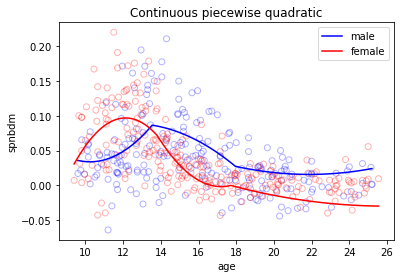

In [117]:
x_space1 = pd.DataFrame(np.linspace(x.min(),x.max(),100)).iloc[:,0]
x_space2 = pd.DataFrame(np.linspace(x2.min(),x2.max(),100)).iloc[:,0]

x_pred1 = get_X_continuous_piecewise_quadratic(x,x_space1)
x_pred2 = get_X_continuous_piecewise_quadratic(x2,x_space2)
pred1 = model_1.predict(x_pred1)
pred2 = model_2.predict(x_pred2)

plt.plot(x_space1, pred1, color='b', label='male')
plt.plot(x_space2, pred2, color='r', label='female')
plt.scatter(x, y, facecolor='None', edgecolor='b', alpha=0.3)
plt.scatter(x2, y2, facecolor='None', edgecolor='r', alpha=0.3)
plt.legend()
plt.xlabel('age')
plt.ylabel('spnbdm')
plt.title('Continuous piecewise quadratic')
plt.show()

## Part 3

### As the plots show, the cubic splines fit the model best. But this fitted model may have high variance at the outer range of the predictors, hence not stable at the boundaries.

In [63]:
from sklearn.model_selection import KFold
from patsy import dmatrix
def R_squared(y, y_pred):
    r_squared  = np.sum((y_pred-np.mean(y))**2)/np.sum((y-np.mean(y))**2)
    return r_squared
def get_knots(x,k):
    df_cut, bins = pd.qcut(X_train,  k, retbins=True)
    return tuple(bins[1:k])

In [75]:
kf = KFold(n_splits=5)
mean_r_squared_male = []
mean_r_squared_female = []
X = X_male
y = y_male
for i in range(6):
    r_squared  = []
    for train_index, test_index in kf.split(X): 
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        bins = get_knots(X_train, i+2)
        transformed_x = dmatrix("bs(x, knots=bins, degree=3, include_intercept=False)", {"x": X_train},return_type='dataframe')
        model = sm.OLS(y_train, transformed_x).fit()
        y_pred = model.predict(dmatrix("bs(x, knots=bins, include_intercept=False)", {"x": X_test},return_type='dataframe'))
        r_squared.append(R_squared(y_test, y_pred))
    mean_r_squared_male.append(np.mean(r_squared))
X = X_female
y = y_female
for i in range(6):
    r_squared  = []
    for train_index, test_index in kf.split(X): 
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        bins = get_knots(X_train, i+2)
        transformed_x = dmatrix("bs(x, knots=bins, degree=3, include_intercept=False)", {"x": X_train},return_type='dataframe')
        model = sm.OLS(y_train, transformed_x).fit()
        y_pred = model.predict(dmatrix("bs(x, knots=bins, include_intercept=False)", {"x": X_test},return_type='dataframe'))
        r_squared.append(R_squared(y_test, y_pred))
    mean_r_squared_female.append(np.mean(r_squared)) 

print('knots: ', [2,3,4,5,6,7])
print('male: ',np.round(mean_r_squared_male,3))
print('female: ',np.round(mean_r_squared_male,3))

knots:  [2, 3, 4, 5, 6, 7]
male:  [0.325 0.328 0.333 0.323 0.322 0.317]
female:  [0.325 0.328 0.333 0.323 0.322 0.317]


### As the results show, we choose the cubic model with 4 knots as the best model.

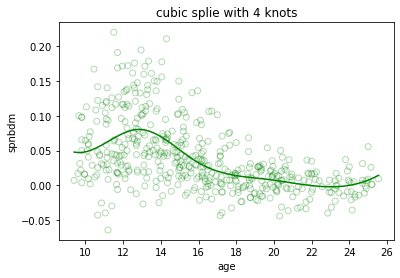

In [80]:
X = X_total
y = y_total
bins = get_knots(X_train, 4)
transformed_x = dmatrix("bs(x, knots=bins, degree=3, include_intercept=False)", {"x": X},return_type='dataframe')
model = sm.OLS(y, transformed_x).fit()
x_space = np.linspace(x.min(),x.max(),70)
pred = model.predict(dmatrix("bs(x, knots=bins,degree =3,include_intercept=False)", {"x": x_space}, return_type='dataframe'))
plt.scatter(X, y, facecolor='None', edgecolor='g', alpha=0.3)
plt.plot(x_space, pred, color='g')
plt.xlabel('age')
plt.ylabel('spnbdm')
plt.title('cubic splie with 4 knots')
plt.show()